In [1]:
import pandas as pd
import numpy as np

import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
mi = pd.read_csv(r"../data/mi_full.csv")
mi['time'] = pd.to_datetime(mi['time'])
mi.head()

,time,det_t2m,det_precip,det_windv,det_windu,det_sfprs,det_wind_speed,det_wind_speed_mph,det_precip_in,det_temp_f,...,gr_windu,gr_sfprs,gr_wind_speed,gr_wind_speed_mph,gr_precip_in,gr_temp_f,mi_rt_lmp,mi_da_lmp,MI_load_forecast,MI_load_actual
0,2013-12-19 00:00:00,-5.199975,0.0,5.849919,1.730580,99328.723333,6.100529,13.829899,0.0,22.640045,...,0.944893,98365.813627,5.919616,13.419770,0.0,24.936019,22.99,28.38,19351,19219.31
1,2013-12-19 01:00:00,-5.596619,0.0,6.476971,1.300262,99222.710027,6.606196,14.976247,0.0,21.926086,...,2.551897,98323.293361,6.838617,15.503146,0.0,25.786370,24.86,27.05,19294,17983.46
2,2013-12-19 02:00:00,-5.503398,0.0,6.557646,2.529697,99151.216485,7.028662,15.933977,0.0,22.093883,...,3.470401,98276.604441,6.895247,15.631525,0.0,27.513214,25.58,26.89,17999,17288.58
3,2013-12-19 03:00:00,-4.168153,0.0,6.244639,3.580197,99086.512376,7.198148,16.318201,0.0,24.497325,...,3.963006,98241.837870,6.648554,15.072273,0.0,29.613721,26.35,26.68,17578,16861.50
4,2013-12-19 04:00:00,-3.712104,0.0,5.863422,4.345900,99034.160126,7.298395,16.545461,0.0,25.318213,...,4.111512,98212.824041,6.255830,14.181967,0.0,30.368735,22.73,26.75,17401,16646.06


In [3]:
small = mi[['time', 
            'det_wind_speed_mph', 
            'det_temp_f', 
            'det_precip_in', 
            'mi_da_lmp', 
            'mi_rt_lmp', 
            'MI_load_forecast', 
            'MI_load_actual']].set_index('time')

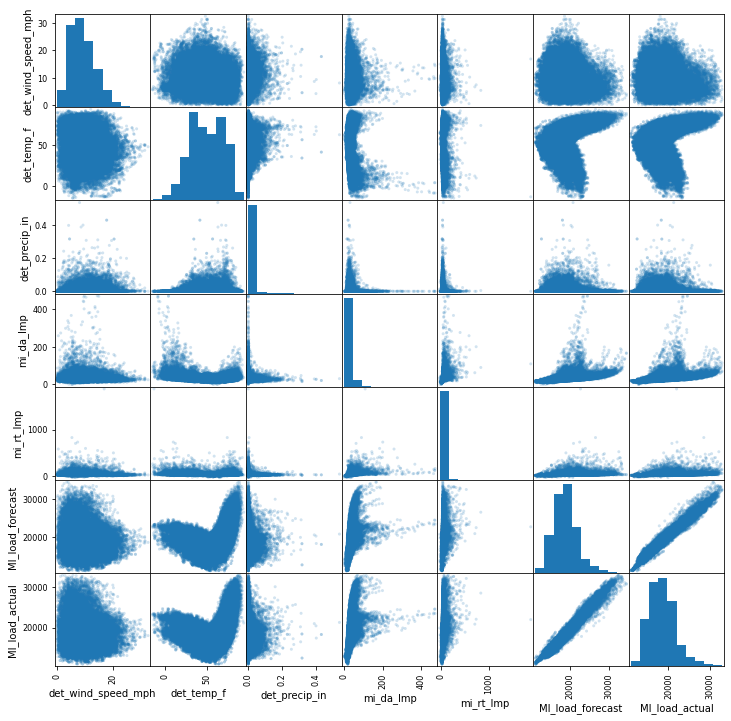

In [4]:
pd.plotting.scatter_matrix(small, 
                           alpha=0.2, 
                           figsize=(12, 12)
                          );

## 2020 Temp below or equal to 55 F

In [5]:
small[(small.index.year == 2020) & (small['det_temp_f'] <= 55)].corr()

,det_wind_speed_mph,det_temp_f,det_precip_in,mi_da_lmp,mi_rt_lmp,MI_load_forecast,MI_load_actual
det_wind_speed_mph,1.000000,0.060598,0.144466,-0.035207,0.043614,-0.026069,-0.007077
det_temp_f,0.060598,1.000000,0.081706,-0.261708,-0.079997,-0.449783,-0.453796
det_precip_in,0.144466,0.081706,1.000000,-0.060414,0.035472,-0.012274,-0.011451
mi_da_lmp,-0.035207,-0.261708,-0.060414,1.000000,0.331489,0.619304,0.656197
mi_rt_lmp,0.043614,-0.079997,0.035472,0.331489,1.000000,0.213052,0.237676
MI_load_forecast,-0.026069,-0.449783,-0.012274,0.619304,0.213052,1.000000,0.978036
MI_load_actual,-0.007077,-0.453796,-0.011451,0.656197,0.237676,0.978036,1.000000


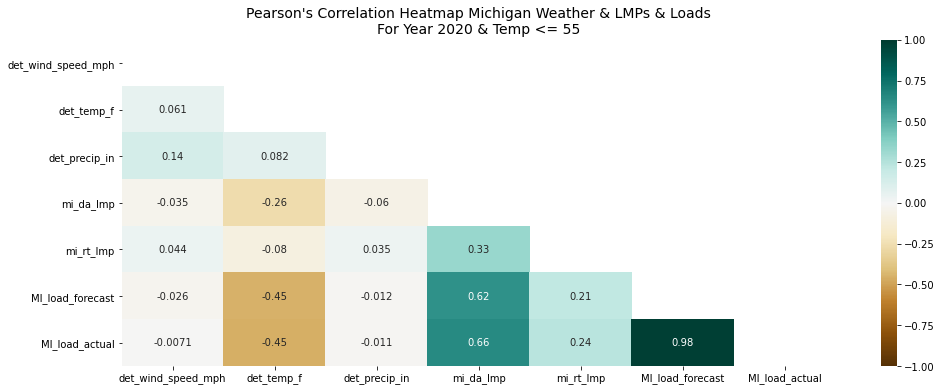

In [6]:
plt.figure(figsize=(16, 6))
mask = np.triu(np.ones_like(small[(small.index.year == 2020) & (small['det_temp_f'] <= 55)].corr(), dtype=np.bool))
heatmap = sns.heatmap(small[(small.index.year == 2020) & (small['det_temp_f'] <= 55)].corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Pearson\'s Correlation Heatmap Michigan Weather & LMPs & Loads\nFor Year 2020 & Temp <= 55', fontdict={'fontsize': 14});

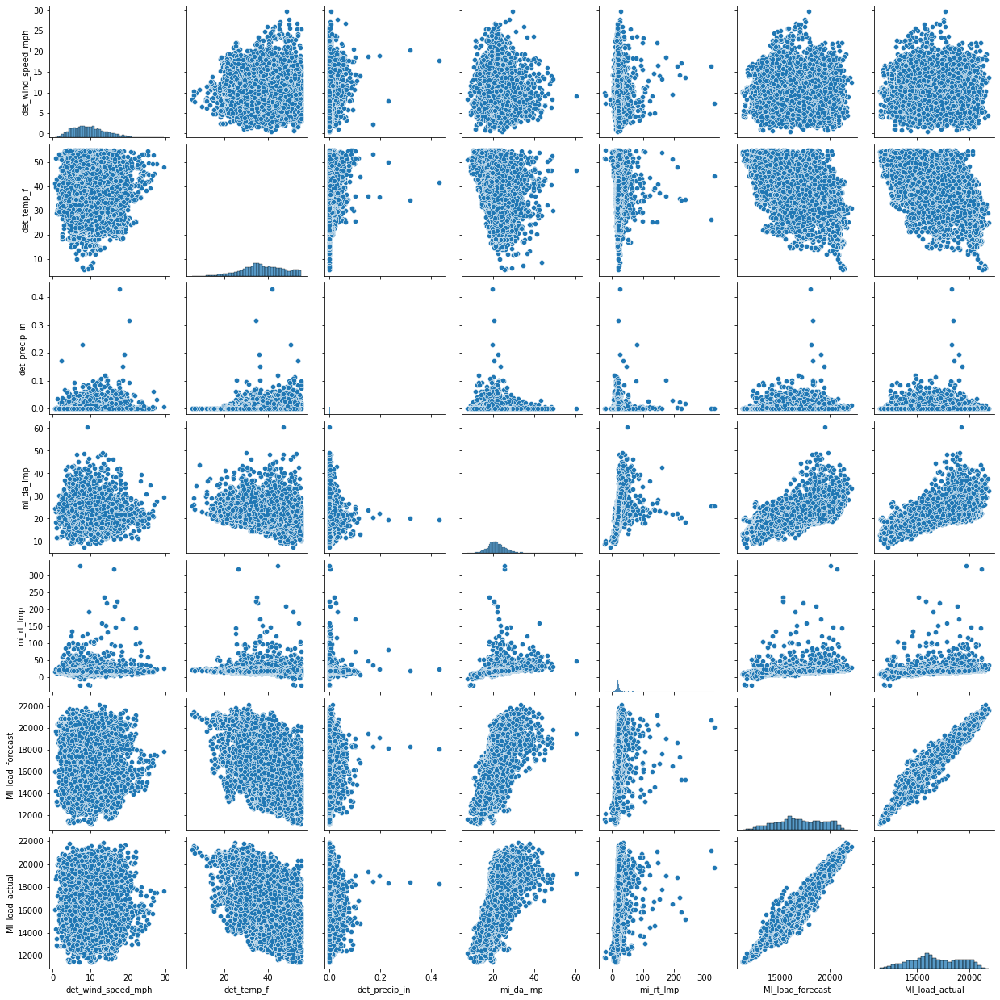

In [7]:
sns.pairplot(small[(small.index.year == 2020) & (small['det_temp_f'] <= 55)]);

In [8]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=small[small['det_temp_f'] <= 55]['MI_load_forecast'],
                         y=small[small['det_temp_f'] <= 55]['det_temp_f'],
                         mode='markers',
                         name='Detroit Temp F'
                        ))


fig.show()

## 2020 Temp greater than or equal to 50 F

In [9]:
small[(small.index.year == 2020) & (small['det_temp_f'] >= 50)].corr()

,det_wind_speed_mph,det_temp_f,det_precip_in,mi_da_lmp,mi_rt_lmp,MI_load_forecast,MI_load_actual
det_wind_speed_mph,1.000000,-0.239667,0.117907,-0.092937,-0.038728,-0.196201,-0.203117
det_temp_f,-0.239667,1.000000,-0.090924,0.418800,0.242168,0.682357,0.692882
det_precip_in,0.117907,-0.090924,1.000000,-0.051574,-0.009793,-0.047656,-0.055276
mi_da_lmp,-0.092937,0.418800,-0.051574,1.000000,0.595546,0.742395,0.728972
mi_rt_lmp,-0.038728,0.242168,-0.009793,0.595546,1.000000,0.417212,0.428576
MI_load_forecast,-0.196201,0.682357,-0.047656,0.742395,0.417212,1.000000,0.989717
MI_load_actual,-0.203117,0.692882,-0.055276,0.728972,0.428576,0.989717,1.000000


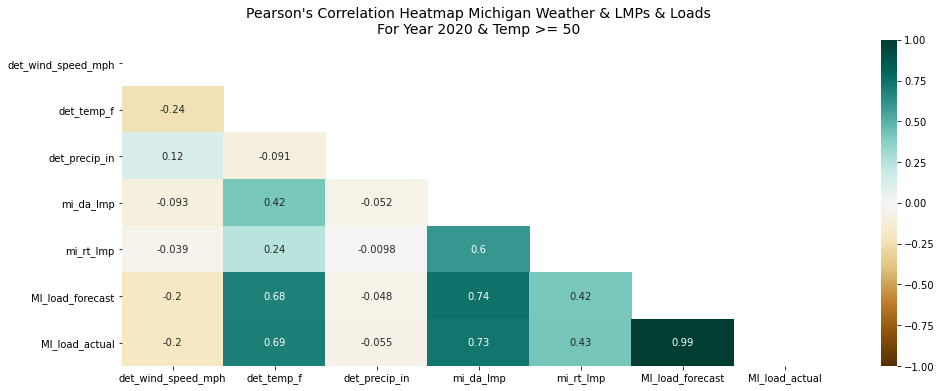

In [10]:
plt.figure(figsize=(16, 6))
mask = np.triu(np.ones_like(small[(small.index.year == 2020) & (small['det_temp_f'] >= 50)].corr(), dtype=np.bool))
heatmap = sns.heatmap(small[(small.index.year == 2020) & (small['det_temp_f'] >= 50)].corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Pearson\'s Correlation Heatmap Michigan Weather & LMPs & Loads\nFor Year 2020 & Temp >= 50', fontdict={'fontsize': 14});

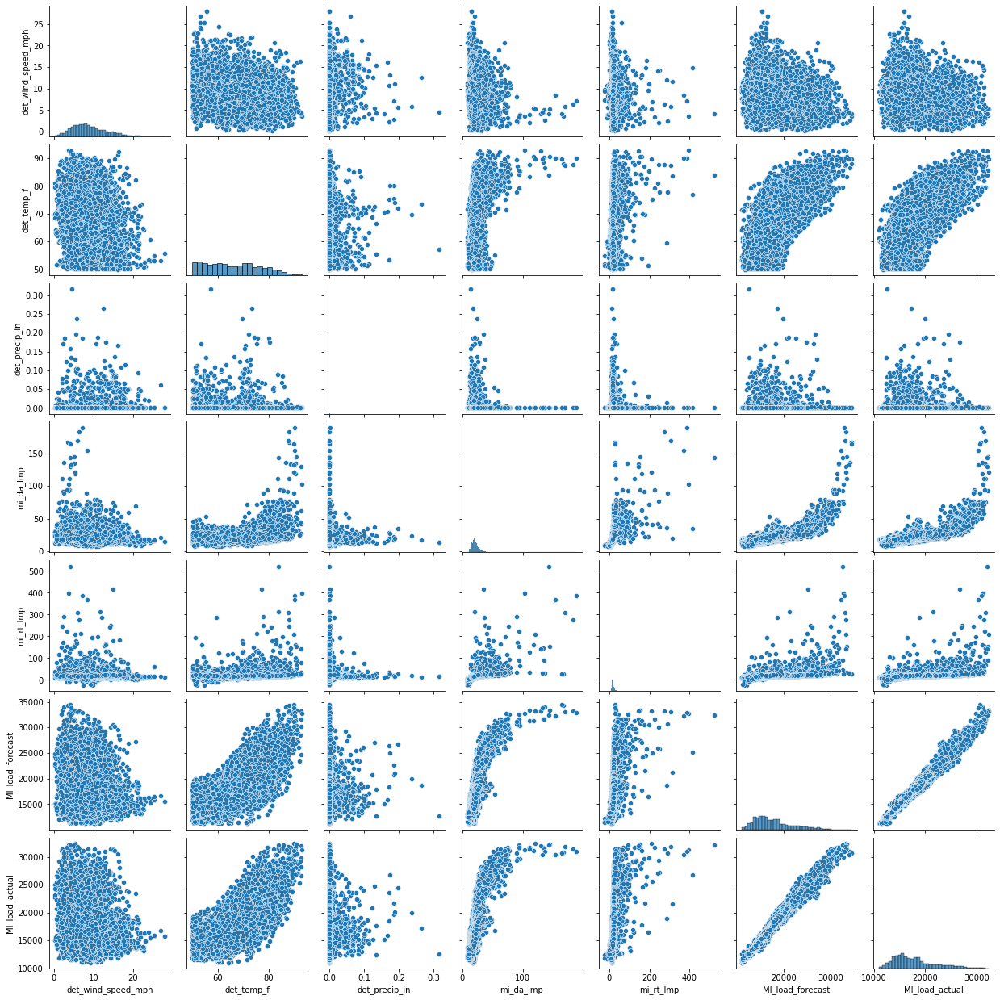

In [11]:
sns.pairplot(small[(small.index.year == 2020) & (small['det_temp_f'] >= 50)]);

In [12]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=small[small['det_temp_f'] >= 55]['MI_load_forecast'],
                         y=small[small['det_temp_f'] >= 55]['det_temp_f'],
                         mode='markers',
                         name='Detroit Temp F'
                        ))


fig.show()

In [13]:
high_rt = small[(small.index.year == 2020) & (small['mi_rt_lmp'] > 85)].reset_index()
high_rt.groupby(high_rt['time'].dt.floor('D')).mean()

,det_wind_speed_mph,det_temp_f,det_precip_in,mi_da_lmp,mi_rt_lmp,MI_load_forecast,MI_load_actual
time,,,,,,,
2020-01-03,6.197557,43.461848,9.856577e-05,24.590000,95.260000,19408.000000,19075.880000
2020-01-06,16.168411,39.002365,1.642763e-04,31.245000,123.550000,19933.500000,19910.800000
2020-01-08,16.341311,26.213029,2.628420e-04,25.410000,320.090000,20729.000000,21153.620000
2020-01-11,16.447292,35.477564,6.196173e-02,21.480000,196.050000,18212.000000,18038.380000
2020-01-12,13.684326,34.677819,1.855665e-02,18.280000,235.690000,15298.000000,15156.010000
2020-01-24,12.220227,36.025537,1.514299e-02,22.790000,114.140000,20114.000000,19978.370000
2020-02-05,8.123904,29.063148,-3.414803e-17,27.280000,95.000000,20822.000000,20872.600000
2020-02-27,22.139458,25.400119,8.180959e-04,27.465000,122.610000,20990.000000,20853.800000
2020-03-04,10.095429,35.976170,-3.414803e-17,24.330000,105.520000,17840.000000,17844.210000


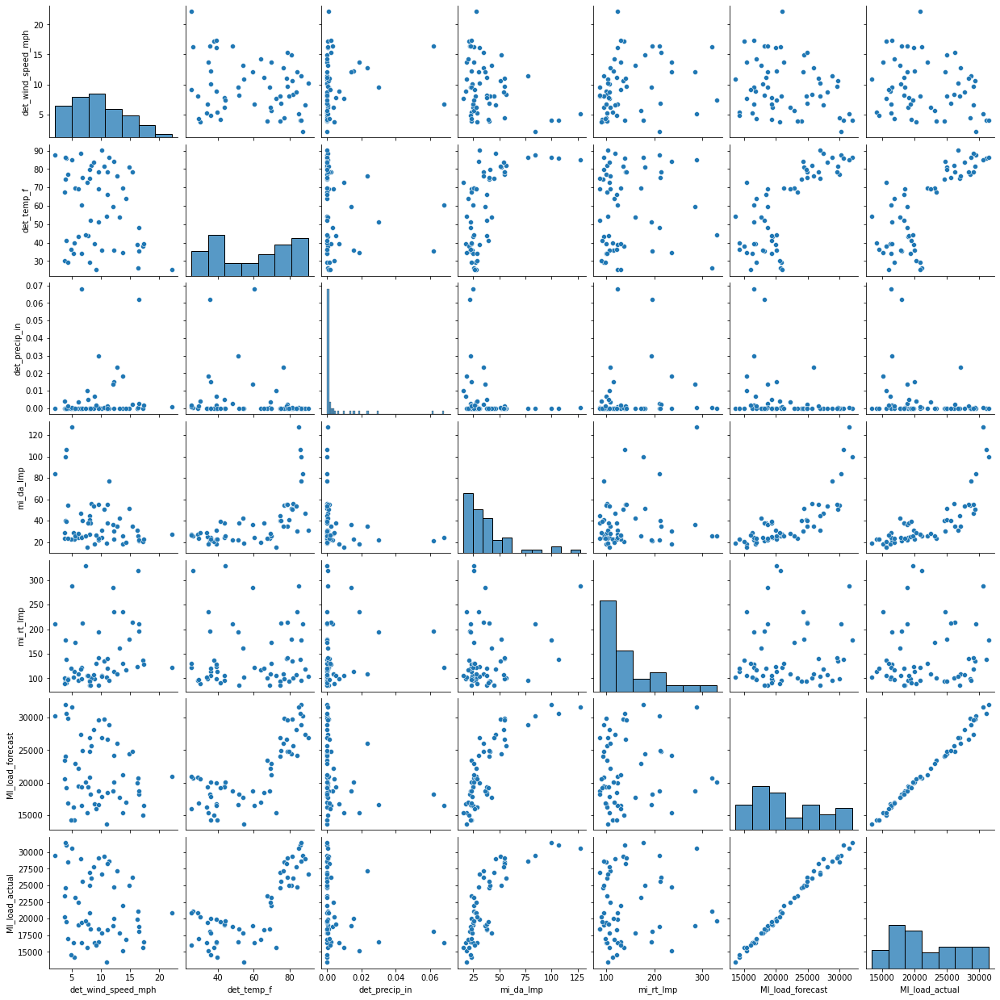

In [14]:
sns.pairplot(high_rt.groupby(high_rt['time'].dt.floor('D')).mean());

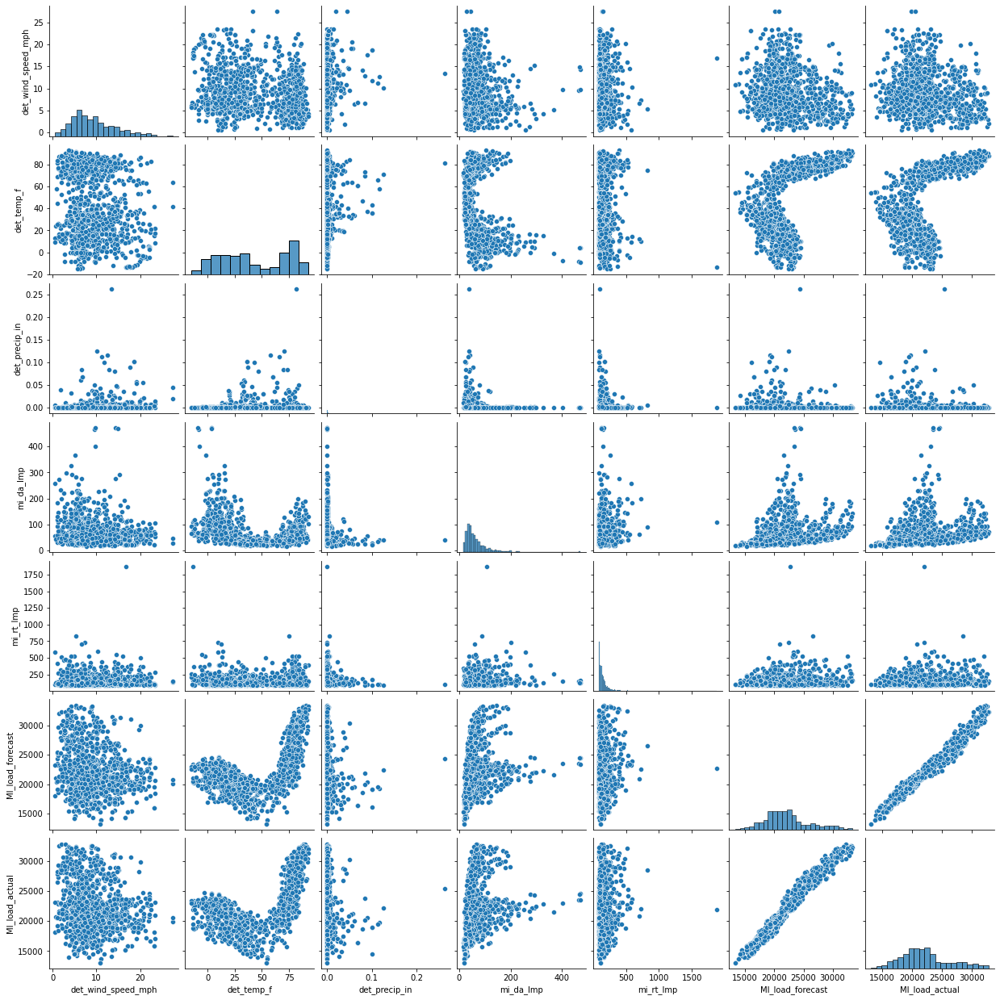

In [15]:
sns.pairplot(small.where(small['mi_rt_lmp'] > 90).dropna());

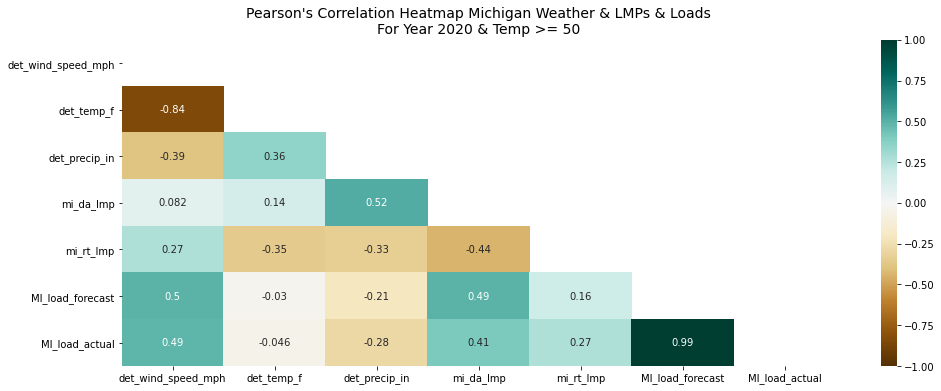

In [21]:
plt.figure(figsize=(16, 6))
mask = np.triu(np.ones_like(small[(small.index.year == 2020) & (small['det_temp_f'] < 32) & (small['det_precip_in'] < 0.1) & (small['mi_rt_lmp'] > 90)].corr(), dtype=np.bool))
heatmap = sns.heatmap(small[(small.index.year == 2020) & (small['det_temp_f'] < 32)  & (small['det_precip_in'] < 0.1) & (small['mi_rt_lmp'] > 90)].corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Pearson\'s Correlation Heatmap Michigan Weather & LMPs & Loads\nFor Year 2020 & Temp >= 50', fontdict={'fontsize': 14});

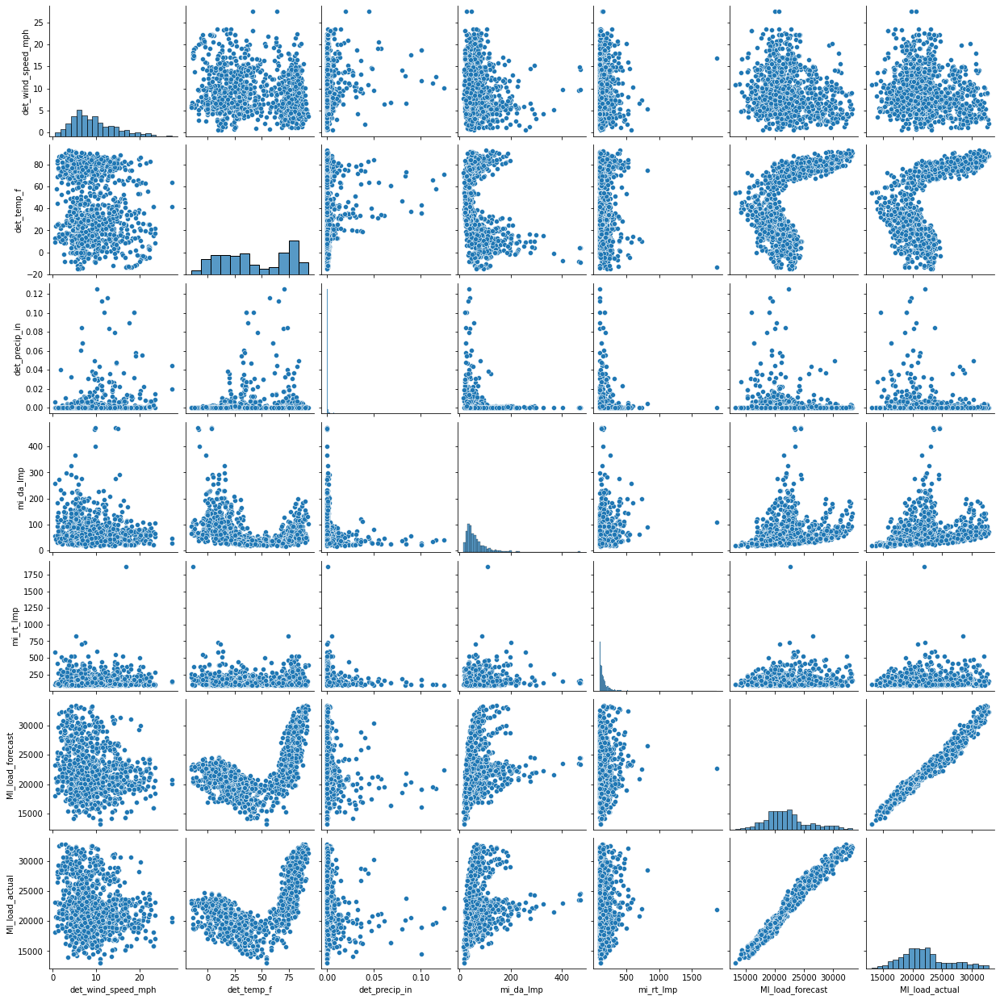

In [31]:
sns.pairplot(small.where((small['mi_rt_lmp'] > 90) & (small['det_precip_in'] < 0.25)).dropna());